## **Importing the necessary libraries and overview of the dataset**

In [2]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='darkgrid')

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

# To compute distances
from scipy.spatial.distance import cdist, pdist

# Importing PCA
from sklearn.decomposition import PCA

# To perform K-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# To import K-Medoids
from sklearn_extra.cluster import KMedoids

# To import DBSCAN and Gaussian Mixture
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

# To perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# To suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Import the data
data = pd.read_csv("../data/merged_data.csv")

In [4]:
# Checking the shape of the data
data.shape

(2691, 20)

Shows the 476 players with 13 features

In [5]:
# View randome sample of the data
data.sample(n = 10, random_state = 1)

,string_id,aq30_id,pfaf_id,gid_1,aqid,gid_0,country,state,area_km2,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,presence_absence
1854,725571-USA.36_1-1288,53187,725571,USA.36_1,1288,USA,United States,Ohio,43.686471,0.000631,0.000137,0.413334,0.502973,0.046615,0.004377,0.404232,1.850749,0.032262,0.001141,0
429,772216-USA.3_1-1600,57883,772216,USA.3_1,1600,USA,United States,Arizona,2290.045275,0.000000,0.000000,1.416470,0.240538,2.181140,0.002488,0.289334,-0.119384,0.031220,0.001105,0
1945,731802-USA.21_1-1216,53738,731802,USA.21_1,1216,USA,United States,Maryland,0.326288,0.783085,0.219786,0.257369,0.050411,-0.274031,0.000172,0.388464,20.209447,0.021644,0.000775,0
2387,742648-USA.18_1-1216,54519,742648,USA.18_1,1216,USA,United States,Kentucky,967.310074,0.006899,0.001895,0.513676,0.225301,-0.274031,0.000637,0.434659,0.934831,0.031995,0.001132,0
1863,725530-USA.33_1-1158,53136,725530,USA.33_1,1158,USA,United States,New York,9606.986423,0.055757,0.015488,0.345503,0.635400,-0.888467,0.001758,0.332297,1.960910,0.029769,0.001415,0
1613,742449-USA.17_1-1363,54348,742449,USA.17_1,1363,USA,United States,Kansas,4643.498699,0.068814,0.021227,0.693022,0.263411,0.328266,0.000708,0.523913,0.934831,0.020727,0.000743,0
2473,742481-USA.37_1-1519,54360,742481,USA.37_1,1519,USA,United States,Oklahoma,2552.189929,0.011839,0.002688,0.747340,0.389566,0.165712,0.000379,0.507868,0.934831,0.022273,0.000797,0
442,772213-USA.3_1-1600,57876,772213,USA.3_1,1600,USA,United States,Arizona,9242.747894,1.761205,1.246411,1.106640,0.476119,2.181140,0.000246,0.302687,-0.109672,0.033246,0.001175,0
1012,812604-USA.2_1-367,59940,812604,USA.2_1,367,USA,United States,Alaska,10873.801775,0.000005,0.000005,0.632346,0.501921,-0.207450,0.000000,0.000000,-1.439017,0.000000,0.000000,0
282,781009-USA.38_1-725,58618,781009,USA.38_1,725,USA,United States,Oregon,1093.168437,0.000182,0.000062,0.239358,0.316639,-0.027497,0.003631,0.273718,-7.710207,0.027961,0.000992,0


In [6]:
# Checking the column names and datatypes
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2691 entries, 0 to 2690
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   string_id         2691 non-null   object 
 1   aq30_id           2691 non-null   int64  
 2   pfaf_id           2691 non-null   int64  
 3   gid_1             2691 non-null   object 
 4   aqid              2691 non-null   int64  
 5   gid_0             2691 non-null   object 
 6   country           2691 non-null   object 
 7   state             2691 non-null   object 
 8   area_km2          2691 non-null   float64
 9   bws_raw           2691 non-null   float64
 10  bwd_raw           2691 non-null   float64
 11  iav_raw           2691 non-null   float64
 12  sev_raw           2691 non-null   float64
 13  gtd_raw           2691 non-null   float64
 14  rfr_raw           2691 non-null   float64
 15  drr_raw           2691 non-null   float64
 16  cep_raw           2691 non-null   float64


In [7]:
# Copying the data to another variable to avoid any changes to original data
df = data.copy()

In [8]:
# Check for duplicate values
df.duplicated().sum()

0

There are no duplicate values

In [9]:
# Check for missing values in the data
df.isnull().sum()

string_id           0
aq30_id             0
pfaf_id             0
gid_1               0
aqid                0
gid_0               0
country             0
state               0
area_km2            0
bws_raw             0
bwd_raw             0
iav_raw             0
sev_raw             0
gtd_raw             0
rfr_raw             0
drr_raw             0
cep_raw             0
udw_raw             0
usa_raw             0
presence_absence    0
dtype: int64

There are no missing values

## **Exploratory Data Analysis**

**Check the statistical summary of the data**

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
aq30_id,2691.0,56579.101821,2837.857596,29004.000000,54326.500000,55294.000000,58680.500000,68401.000000
pfaf_id,2691.0,750652.575622,95657.924622,0.000000,742412.000000,751910.000000,782300.000000,821004.000000
aqid,2691.0,1067.349684,468.345644,0.000000,740.000000,1216.000000,1400.000000,1793.000000
area_km2,2691.0,3041.224817,4496.079277,0.004343,209.589047,1338.879402,4078.623483,43544.560066
bws_raw,2691.0,0.426823,0.984107,0.000000,0.001552,0.079560,0.389725,11.955757
bwd_raw,2691.0,0.236935,0.568800,0.000000,0.000427,0.023149,0.137545,6.397558
iav_raw,2691.0,0.565075,0.304964,0.000000,0.389728,0.531438,0.698350,5.239926
sev_raw,2691.0,0.416267,0.227540,0.000000,0.251298,0.378129,0.542522,1.596155
gtd_raw,2691.0,0.294343,1.075662,-2.875680,-0.159729,0.001182,0.363141,10.717500
rfr_raw,2691.0,0.002601,0.004343,0.000000,0.000211,0.000952,0.002829,0.038593


### **Univariate Analysis**

In [11]:
# Function to plot a boxplot and a histogram along the same scale


def histogram_boxplot(data, feature, figsize = (12, 7), kde = False, bins = None):
    
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12, 7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows = 2,  # Number of rows of the subplot grid= 2
        sharex = True,  # X-axis will be shared among all subplots
        gridspec_kw = {"height_ratios": (0.25, 0.75)},
        figsize = figsize,
    )  # Creating the 2 subplots
    sns.boxplot(
        data = data, x = feature, ax = ax_box2, showmeans = True, color = "violet"
    )  # Boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2, bins = bins, palette = "winter"
    ) if bins else sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color = "green", linestyle = "--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color = "black", linestyle = "-"
    )  # Add median to the histogram

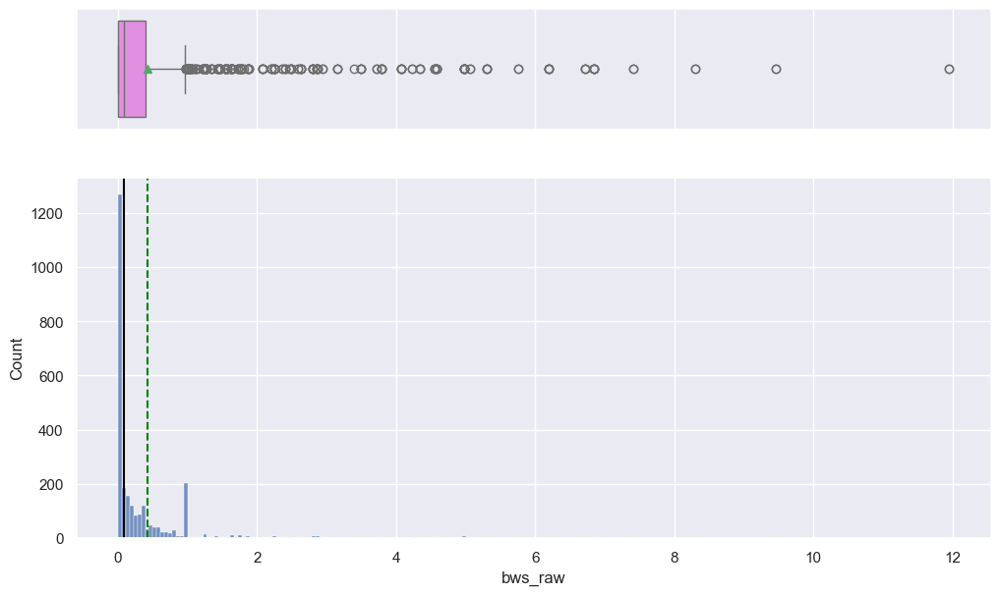

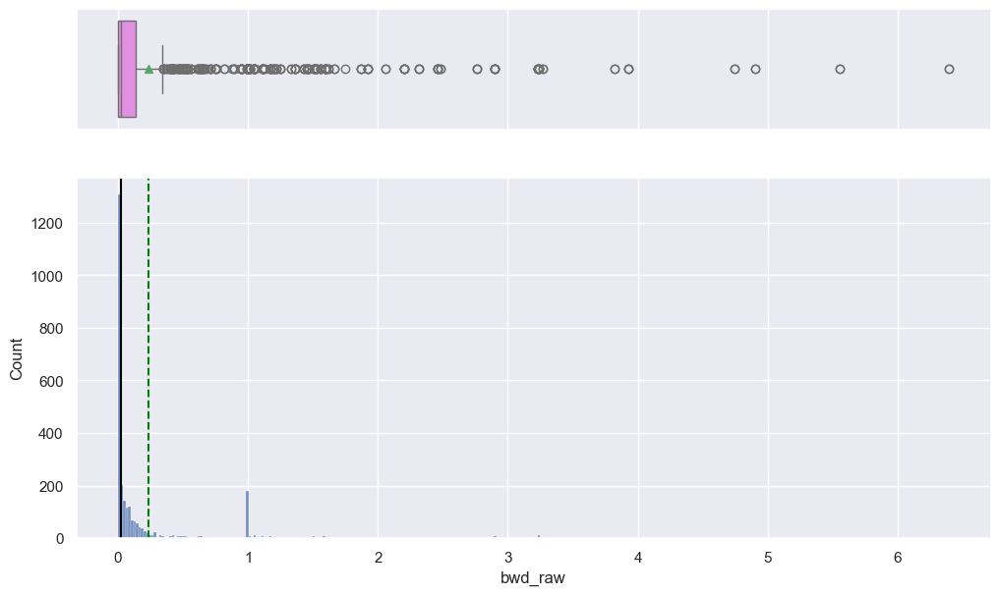

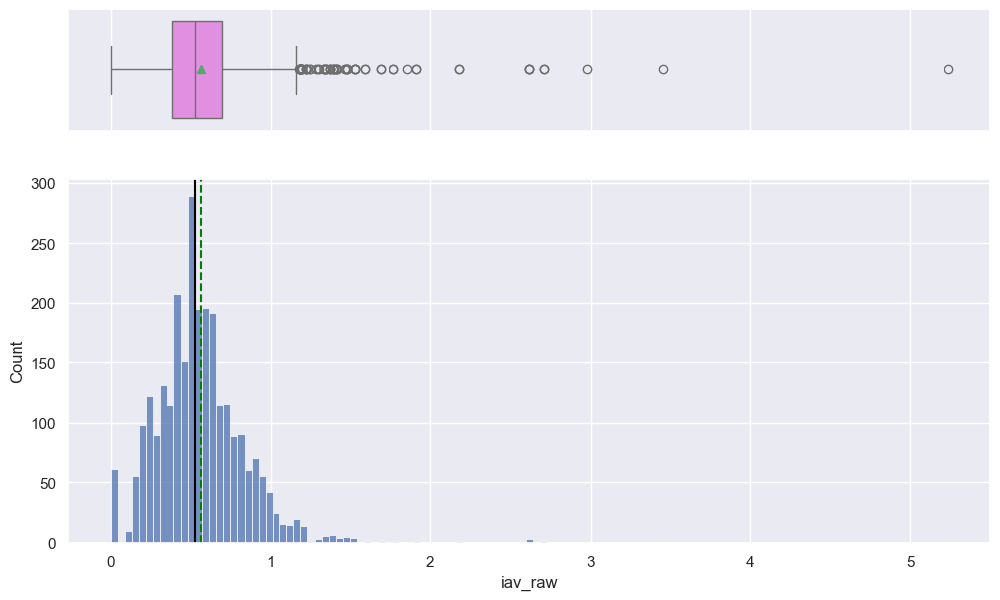

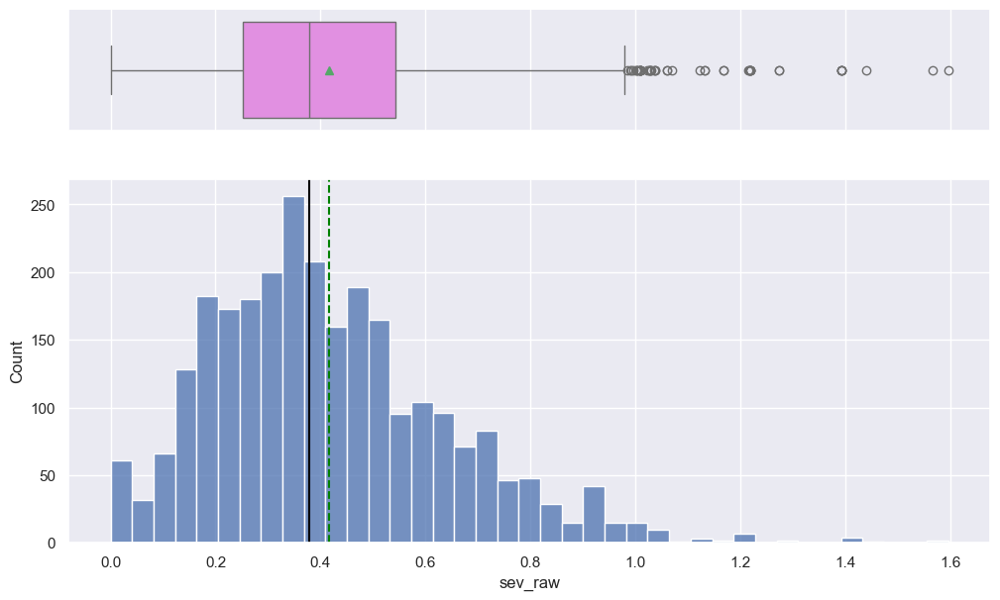

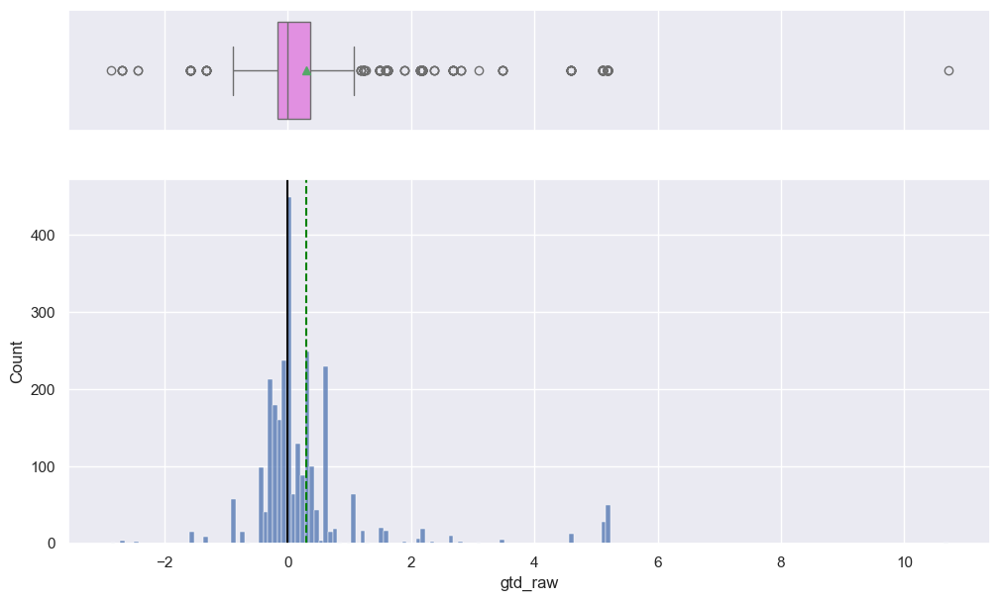

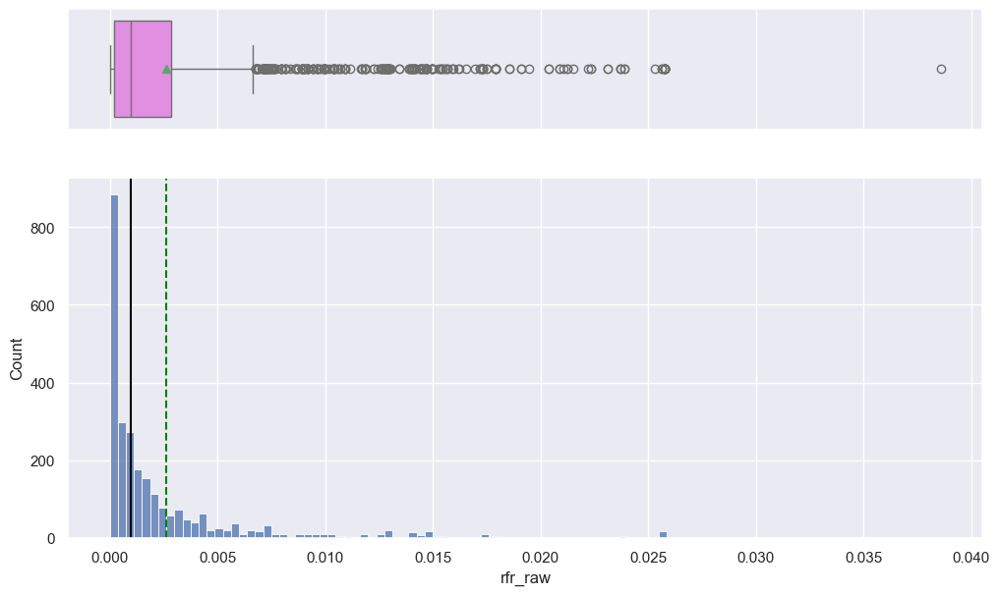

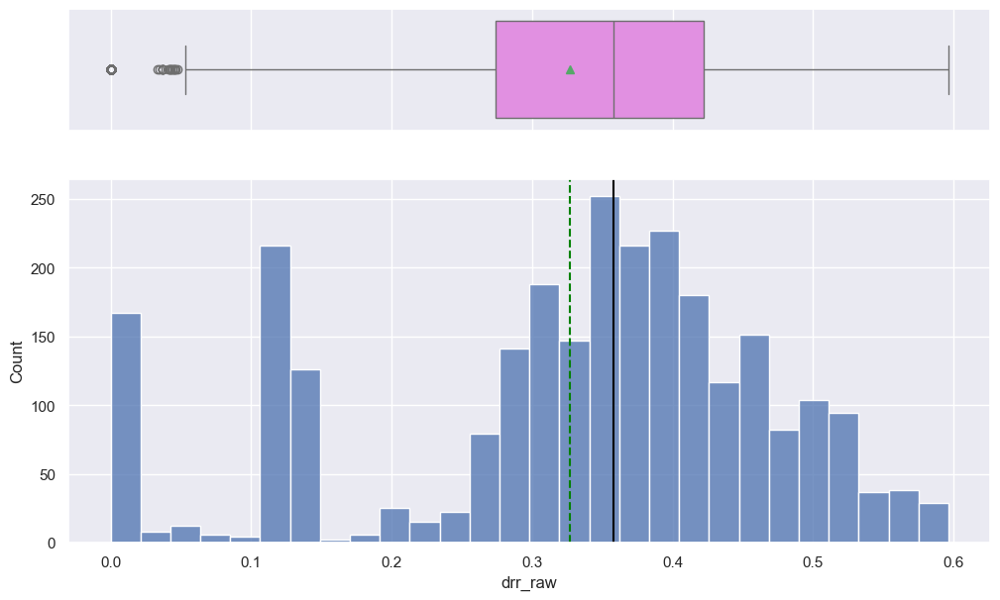

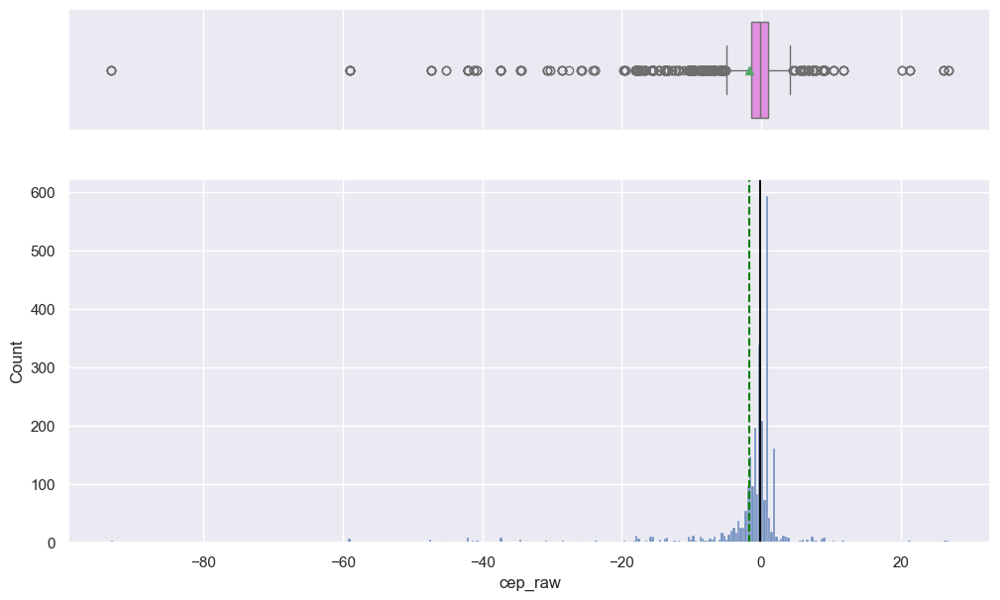

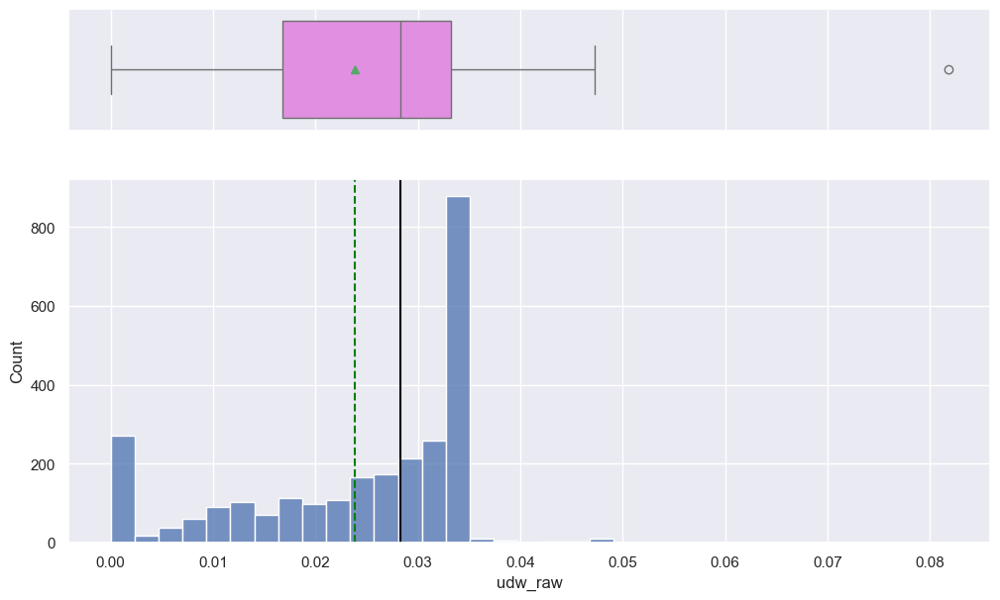

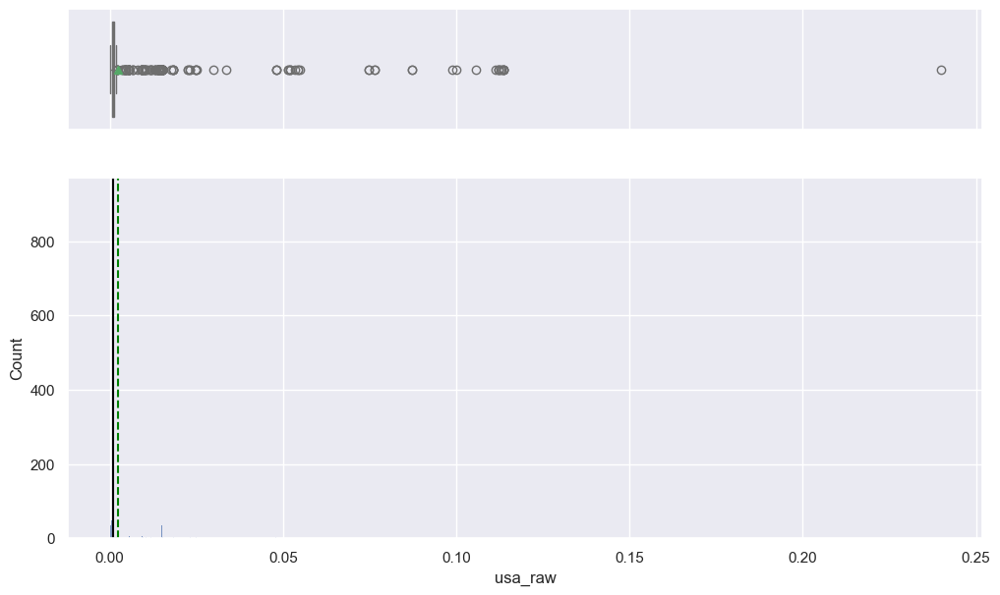

In [12]:
histogram_boxplot(df, 'bws_raw')
histogram_boxplot(df, 'bwd_raw')  
histogram_boxplot(df, 'iav_raw')
histogram_boxplot(df, 'sev_raw')
histogram_boxplot(df, 'gtd_raw')
histogram_boxplot(df, 'rfr_raw')
histogram_boxplot(df, 'drr_raw')
histogram_boxplot(df, 'cep_raw')
histogram_boxplot(df, 'udw_raw')
histogram_boxplot(df, 'usa_raw')

In [13]:
# Function to create labeled barplots


def labeled_barplot(data, feature, perc = False, n = None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # Length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize = (count + 1, 5))
    else:
        plt.figure(figsize = (n + 1, 5))

    plt.xticks(rotation = 90, fontsize = 15)
    ax = sns.countplot(
        data = data,
        x = feature,
        palette = "Paired",
        order = data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # Percentage of each class of the category
        else:
            label = p.get_height()  # Count of each level of the category

        x = p.get_x() + p.get_width() / 2  # Width of the plot
        y = p.get_height()  # Height of the plot

        ax.annotate(
            label,
            (x, y),
            ha = "center",
            va = "center",
            size = 12,
            xytext = (0, 5),
            textcoords = "offset points",
        )  # Annotate the percentage

    plt.show()  # Show the plot

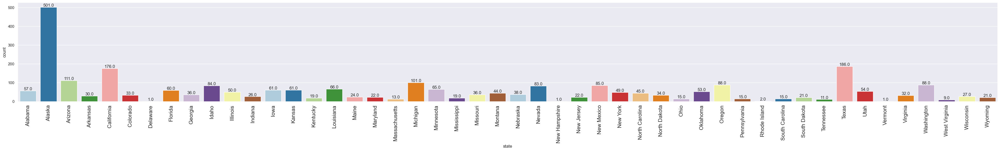

In [14]:
labeled_barplot(df, 'state')

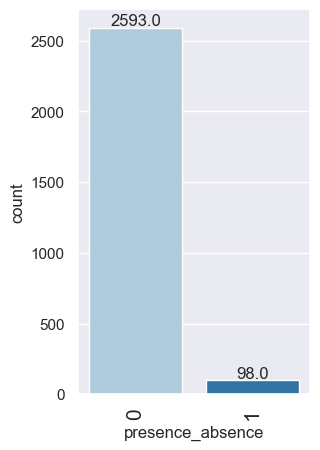

In [15]:
labeled_barplot(df, 'presence_absence')

### **Bivariate Analysis**

**We are done with univariate analysis. Let's explore the data a bit more with bivariate analysis.**

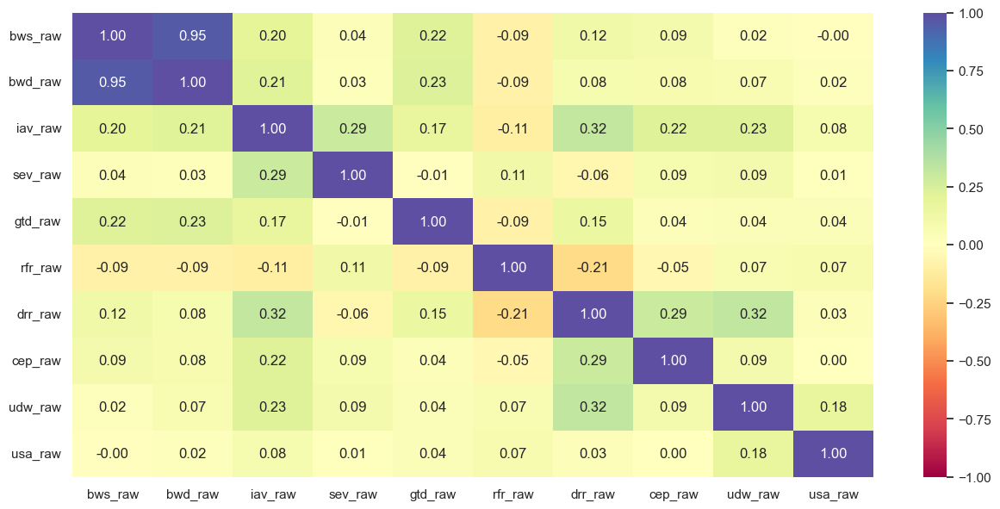

In [16]:
# Correlation check
cols_list = [col for col in data.columns if '_raw' in col] 

plt.figure(figsize = (15, 7))

sns.heatmap(
    df[cols_list].corr(), annot = True, vmin = -1, vmax = 1, fmt = ".2f", cmap = "Spectral"
)

plt.show()

### **Outlier Check**

- Plot boxplots of all numerical columns to check for outliers.

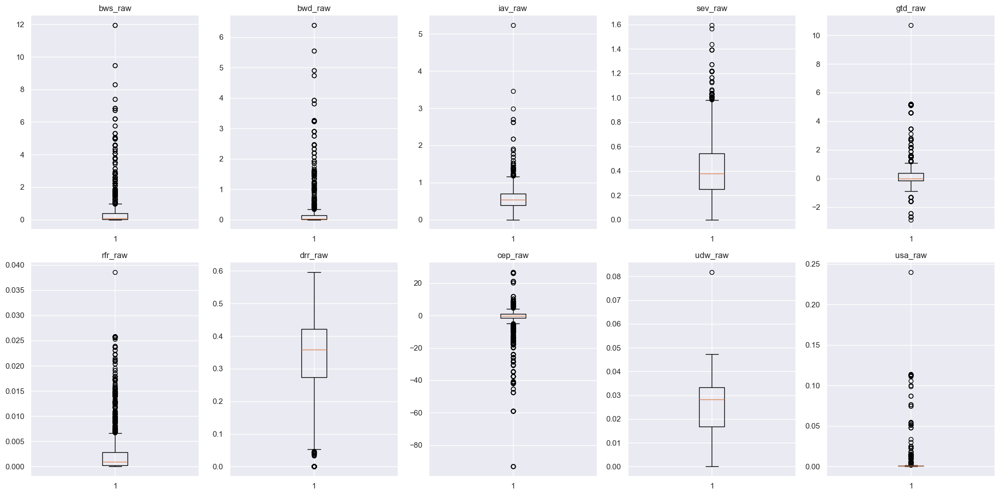

In [17]:
plt.figure(figsize = (20, 10))

numeric_columns = [col for col in data.columns if '_raw' in col] 

for i, variable in enumerate(numeric_columns):
    
    plt.subplot(2, 5, i + 1)
    
    plt.boxplot(df[variable], whis = 1.5)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

### **Scaling**

- Scale the data before we proceed with clustering.

In [18]:
# Scaling the data before clustering
scaler = StandardScaler() # Initialize the Standard Scaler

subset = df[numeric_columns].copy()  # Data with numerical features

subset_scaled = scaler.fit_transform(subset) # Fit_transform the scaler function on data subset

In [19]:
# Creating a dataframe of the scaled data
subset_scaled_df = pd.DataFrame(subset_scaled, columns = subset.columns)

In [20]:
subset_scaled_df.head(5)

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
0,0.153422,-0.198524,-0.795227,-0.425115,-0.673994,-0.315565,0.529978,0.445152,-0.303092,-0.163528
1,0.249094,-0.154149,-0.297512,-1.079936,0.286976,-0.417063,0.280918,0.183482,0.077799,-0.149416
2,4.959941,2.324333,0.520674,0.376564,-0.613360,-0.377639,0.274224,0.649106,-1.658016,-0.213727
3,-0.369277,-0.362651,-0.581007,0.374742,-0.299257,-0.267064,-0.226543,-2.026681,-0.423032,-0.167972
4,0.271785,0.084579,0.054110,0.112785,0.286976,1.063298,-0.076366,-0.996817,-1.606333,-0.211868


### **Applying PCA**
PCA is a dimentionality reduction function that makes clustering easier

In [21]:
# Defining the number of principal components to generate
n = subset.shape[1]                                    # Storing the number of variables in the subset data
# returns 10 as that is the number of numerical features

pca = PCA(n_components = n, random_state = 1)          # Initialize PCA with n_components = n and random_state = 1

data_pca = pd.DataFrame(pca.fit_transform(subset_scaled_df))              # Fit_transform PCA on the scaled data

# The percentage of variance explained by each principal component is stored
exp_var = pca.explained_variance_ratio_                     

## **K-Means Clustering**

In [22]:
# copy of the pca data frame for k-means
k_means_df = data_pca.copy()

Number of Clusters: 1 	Average Distortion: 2.662154646018561
Number of Clusters: 2 	Average Distortion: 2.457812668407933
Number of Clusters: 3 	Average Distortion: 2.3485726997236163
Number of Clusters: 4 	Average Distortion: 2.215699474193996
Number of Clusters: 5 	Average Distortion: 2.1444545569470144
Number of Clusters: 6 	Average Distortion: 2.082383719119943
Number of Clusters: 7 	Average Distortion: 1.9684360162716714
Number of Clusters: 8 	Average Distortion: 1.8677953276983787
Number of Clusters: 9 	Average Distortion: 1.7947092464974208
Number of Clusters: 10 	Average Distortion: 1.7149705840492075
Number of Clusters: 11 	Average Distortion: 1.6759350767437244
Number of Clusters: 12 	Average Distortion: 1.6574547036085532
Number of Clusters: 13 	Average Distortion: 1.6262687026080838
Number of Clusters: 14 	Average Distortion: 1.5664085663761453


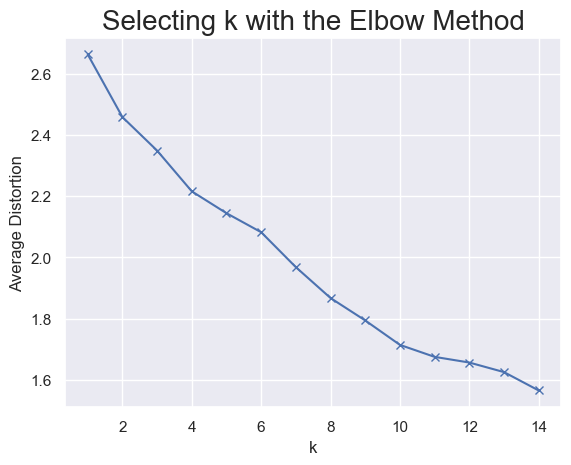

In [23]:
# determin k value

clusters = range(1, 15)
meanDistortions = []

for k in clusters:
    
    model = KMeans(n_clusters = k, random_state = 42)
    
    model.fit(data_pca)
    
    prediction = model.predict(k_means_df)
    
    distortion = (
        sum(np.min(cdist(k_means_df, model.cluster_centers_, "euclidean"), axis = 1))
        / k_means_df.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")

plt.xlabel("k")

plt.ylabel("Average Distortion")

plt.title("Selecting k with the Elbow Method", fontsize = 20)

plt.show()

**Observations and Insights:**

- We will move ahead with k = 6 as this is when the graph starts to move nearly parallel to the X-axis. 

In [24]:
# Create K-Means with nclusters = 6
kmeans = KMeans(n_clusters = 6, random_state = 42) 

kmeans.fit(k_means_df)

KMeans(n_clusters=6, random_state=42)

In [25]:
# Creating a copy of the original data
df1 = subset_scaled_df.copy()

# Adding K-Means cluster labels to the K-Means dataframe
k_means_df["KM_segments"] = kmeans.labels_

# Adding K-Means cluster labels to the original dataframe
df1["KM_segments"] = kmeans.labels_

In [26]:
df1

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,KM_segments
0,0.153422,-0.198524,-0.795227,-0.425115,-0.673994,-0.315565,0.529978,0.445152,-0.303092,-0.163528,1
1,0.249094,-0.154149,-0.297512,-1.079936,0.286976,-0.417063,0.280918,0.183482,0.077799,-0.149416,1
2,4.959941,2.324333,0.520674,0.376564,-0.613360,-0.377639,0.274224,0.649106,-1.658016,-0.213727,3
3,-0.369277,-0.362651,-0.581007,0.374742,-0.299257,-0.267064,-0.226543,-2.026681,-0.423032,-0.167972,2
4,0.271785,0.084579,0.054110,0.112785,0.286976,1.063298,-0.076366,-0.996817,-1.606333,-0.211868,4
...,...,...,...,...,...,...,...,...,...,...,...
2686,-0.398277,-0.402658,0.123828,0.329023,0.091170,-0.532098,1.712749,0.331682,0.185557,-0.145424,1
2687,-0.398277,-0.402658,0.123828,0.329023,0.004414,-0.532098,1.712749,0.331682,0.185557,-0.145424,1
2688,-0.431865,-0.415849,0.125891,0.388108,-0.528493,-0.435055,1.668716,0.331682,0.832244,-0.121464,1
2689,-0.078071,-0.283348,1.351898,0.474132,-0.528493,-0.501320,1.736403,0.331682,0.120825,-0.147822,1


### **Cluster Profiling**

In [27]:
# groupby the cluster labels
km_cluster_profile = df1.groupby("KM_segments").mean()  

In [28]:
# Creating the "count_in_each_segment" feature in K-Means cluster profile

km_cluster_profile["bws_raw"] = (
    df1.groupby("KM_segments")["bws_raw"].count().values) 

In [30]:
# Highlight the maximum average value among all the clusters for each of the variables
km_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0) 

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
KM_segments,,,,,,,,,,
0,199,-0.314336,-0.351973,0.423509,-0.305722,2.913141,-1.033114,-0.099246,0.188023,0.011610
1,1691,-0.063906,0.267397,-0.023856,0.119250,-0.239347,0.517285,0.224272,0.323309,-0.104430
2,115,-0.406390,-1.038660,-0.537906,-0.113447,-0.151194,-0.988153,-3.705222,-0.457723,-0.033217
3,94,3.940863,0.482661,0.329506,0.845306,-0.346951,0.292902,0.175314,-0.092663,-0.155732
4,565,-0.293573,-0.598385,-0.027828,-0.397343,-0.247838,-1.065986,0.078000,-1.010378,-0.072402
5,27,0.473372,1.112489,0.098890,0.639745,0.557404,0.712875,0.224300,1.780742,8.653540


**Let's plot the boxplot**

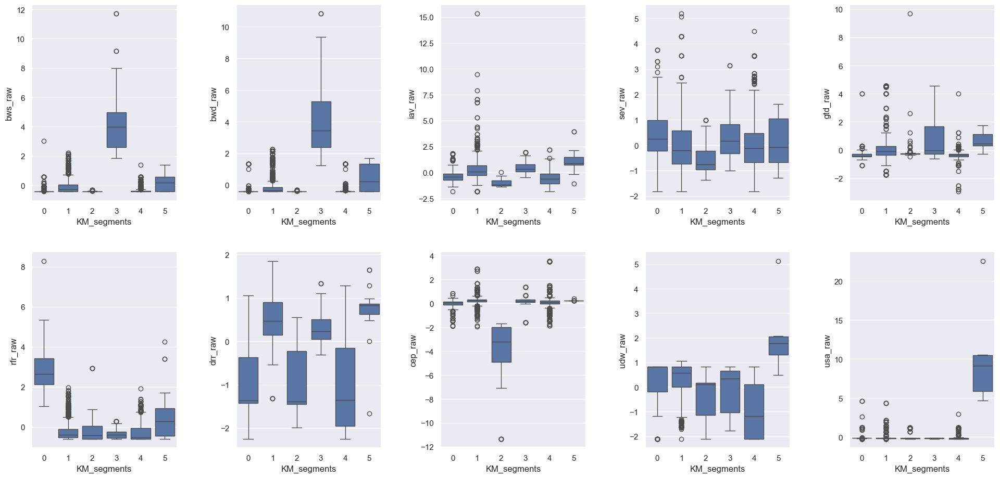

In [31]:
fig, axes = plt.subplots(2, 5, figsize = (20, 10))
counter = 0

for ii in range(2):
    for jj in range(5):
        if counter < 10:
            sns.boxplot(
                ax = axes[ii][jj],
                data = df1,
                y = df1.columns[0 + counter],
                x = "KM_segments",
            )
            counter = counter + 1

fig.tight_layout(pad = 3.0)

## **K-Medoids Clustering**

Centers the clusters around a data point rather than a mean, is more computationally expensive but can provide better results

In [32]:
kmed_df = data_pca.copy()

In [33]:
kmed = KMedoids(n_clusters = 6, random_state = 42) # Create K-Medoids with nclusters = 6
kmed.fit(kmed_df)

KMedoids(n_clusters=6, random_state=42)

In [34]:
# Creating a copy of the original data
df2 = subset_scaled_df.copy()

# Add K-Medoids cluster labels to K-Medoids data
kmed_df["KMed_segments"] = kmed.labels_

# Add K-Medoids cluster labels to original data
df2["KMed_segments"] =  kmed.labels_

In [35]:
df2

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,KMed_segments
0,0.153422,-0.198524,-0.795227,-0.425115,-0.673994,-0.315565,0.529978,0.445152,-0.303092,-0.163528,5
1,0.249094,-0.154149,-0.297512,-1.079936,0.286976,-0.417063,0.280918,0.183482,0.077799,-0.149416,5
2,4.959941,2.324333,0.520674,0.376564,-0.613360,-0.377639,0.274224,0.649106,-1.658016,-0.213727,0
3,-0.369277,-0.362651,-0.581007,0.374742,-0.299257,-0.267064,-0.226543,-2.026681,-0.423032,-0.167972,2
4,0.271785,0.084579,0.054110,0.112785,0.286976,1.063298,-0.076366,-0.996817,-1.606333,-0.211868,2
...,...,...,...,...,...,...,...,...,...,...,...
2686,-0.398277,-0.402658,0.123828,0.329023,0.091170,-0.532098,1.712749,0.331682,0.185557,-0.145424,1
2687,-0.398277,-0.402658,0.123828,0.329023,0.004414,-0.532098,1.712749,0.331682,0.185557,-0.145424,1
2688,-0.431865,-0.415849,0.125891,0.388108,-0.528493,-0.435055,1.668716,0.331682,0.832244,-0.121464,1
2689,-0.078071,-0.283348,1.351898,0.474132,-0.528493,-0.501320,1.736403,0.331682,0.120825,-0.147822,3


### **Cluster Profiling**

In [36]:
# Take the cluster-wise mean of all the variables. 
kmed_cluster_profile = df2.groupby("KMed_segments").mean()

In [37]:
# Create the "count_in_each_segment" column in K-Medoids cluster profile
kmed_cluster_profile["bws_raw"] = (
    df2.groupby("KMed_segments")["bws_raw"].count().values
)


In [38]:
# Highlight the maximum average value among all the clusters for each of the variables

kmed_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0)

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
KMed_segments,,,,,,,,,,
0,318,2.139729,0.369652,-0.157132,0.427283,-0.276165,0.026691,0.183649,0.146836,-0.023634
1,486,-0.275907,0.297140,-0.551219,0.157011,-0.346087,0.947335,0.336321,-0.152141,-0.108017
2,656,-0.363331,-0.558471,0.242431,-0.314326,-0.248294,-0.963845,-0.561993,-0.799432,-0.069763
3,476,-0.113619,0.954521,0.906434,0.474344,-0.218760,0.483969,0.223780,0.567756,0.265351
4,208,-0.316522,-0.359060,0.364502,-0.318520,2.868351,-1.043699,-0.218206,0.193134,0.071353
5,547,-0.343837,-0.503236,-0.637026,-0.302598,-0.134529,0.274423,0.156641,0.441043,-0.064665


**Let's plot the boxplot**

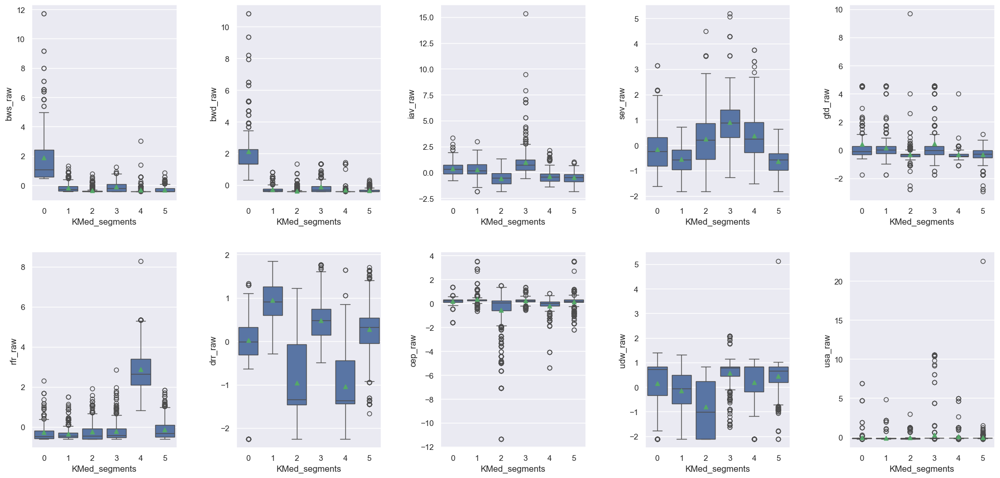

In [39]:
# Create boxplot for each of the variables
fig, axes = plt.subplots(2, 5, figsize = (20, 10))
counter = 0

for ii in range(2):
    for jj in range(5):
        if counter < 10:
            sns.boxplot(
                ax = axes[ii][jj],
                data = df2,
                y = df2.columns[0 + counter],
                x = "KMed_segments", showmeans = True
            )
            counter = counter + 1

fig.tight_layout(pad = 3.0)

##  **Hierarchical Clustering**

More computationally expensive, but pottentially improves on K-means in a few ways:
* Rather than centering around a mean of a pre set number of clusters, hierarchical clustering builds a hierarchy of clusters. 
* Cannot get stuck on local minimi

In [40]:
hc_df = data_pca.copy()

In [41]:
# List of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# List of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(hc_df, metric = dm, method = lm)
        c, coph_dists = cophenet(Z, pdist(hc_df))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm
            
# Printing the combination of distance metric and linkage method with the highest cophenetic correlation
print('*'*100)
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Cophenetic correlation for Euclidean distance and single linkage is 0.8258500703050093.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7646116601132138.
Cophenetic correlation for Euclidean distance and average linkage is 0.8977922445731559.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.6917487989460097.
Cophenetic correlation for Chebyshev distance and single linkage is 0.8334666309577841.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7884647410159413.
Cophenetic correlation for Chebyshev distance and average linkage is 0.8420761558685476.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.6787462410963814.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.7837813645131533.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.6910236572286866.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.8619325178446839.
Cophenetic co

**Explore different linkage methods with Euclidean distance only.**

In [42]:
# List of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(hc_df, metric = "euclidean", method = lm)
    c, coph_dists = cophenet(Z, pdist(hc_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm
        
# Printing the combination of distance metric and linkage method with the highest cophenetic correlation
print('*'*100)
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Cophenetic correlation for single linkage is 0.8258500703050093.
Cophenetic correlation for complete linkage is 0.7646116601132138.
Cophenetic correlation for average linkage is 0.8977922445731559.
Cophenetic correlation for centroid linkage is 0.8869486628977901.
Cophenetic correlation for ward linkage is 0.45246352125073713.
Cophenetic correlation for weighted linkage is 0.6917487989460097.
****************************************************************************************************
Highest cophenetic correlation is 0.8977922445731559, which is obtained with average linkage.


**Dendrograms for the different linkage methods with Euclidean distance only.**

In [43]:
# List of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# Lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# To create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize = (15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(hc_df, metric = "euclidean", method = method)

    dendrogram(Z, ax = axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(hc_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

Error in callback <function flush_figures at 0x000001B3300A0F70> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [ ]:
# Create and print a dataframe to compare cophenetic correlations for different linkage methods
df_cc = pd.DataFrame(compare, columns = compare_cols)
df_cc = df_cc.sort_values(by = "Cophenetic Coefficient")
df_cc

,Linkage,Cophenetic Coefficient
4,ward,0.452464
5,weighted,0.691749
1,complete,0.764612
0,single,0.825850
3,centroid,0.886949
2,average,0.897792


In [ ]:
hc_df

,0,1,2,3,4,5,6,7,8,9
0,-0.313106,0.109599,-0.822475,-0.033405,-0.908426,0.135006,0.228780,-0.205943,-0.516124,0.187936
1,0.103378,0.194781,-1.068778,0.537102,-0.203167,-0.282896,-0.037543,-0.016382,0.218527,0.296154
2,3.840574,3.181206,0.335929,-1.116604,-1.469006,0.820161,0.971547,0.641642,-0.893253,1.735690
3,-1.227647,0.757926,0.183977,0.179026,0.947428,0.949227,-0.859457,0.129800,-0.754908,-0.034205
4,-0.442320,1.204457,0.562093,-0.310405,0.568922,-0.542341,0.082776,1.230954,-0.857166,0.031509
...,...,...,...,...,...,...,...,...,...,...
2686,0.404720,-1.301148,-0.925921,-0.229850,0.051359,0.039225,-0.228028,-0.013529,-1.001968,-0.087464
2687,0.380376,-1.305326,-0.916695,-0.243889,-0.007683,0.092772,-0.229202,0.002971,-1.004610,-0.088173
2688,0.315190,-1.632834,-0.638383,-0.106926,-0.474422,0.426357,-0.570589,-0.157662,-0.806127,-0.070118
2689,0.927684,-1.574412,-0.586715,-0.708003,-0.103732,0.652714,-0.210102,0.871510,-0.633360,0.067121


Use 6 clusters, euclidean distance, and average linkage (sklearn does not support weighted linkage so average is the next best option)

In [ ]:
HCmodel = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='average')
HCmodel.fit(hc_df)  # hc_df should be your dataset

AgglomerativeClustering(linkage='average', n_clusters=6)

In [ ]:
# Creating a copy of the original data
df3 = subset_scaled_df.copy()

# Adding hierarchical cluster labels to the Heirarhical and original dataframes
hc_df["HC_segments"] = HCmodel.labels_
df3["HC_segments"] = HCmodel.labels_

### **Cluster Profiling (average linkage)**

In [ ]:
# Take the cluster-wise mean of all the variables.
hc_cluster_profile = df3.groupby("HC_segments").mean()

In [ ]:
# Create the "count_in_each_segment" column in hierarchical cluster profile
hc_cluster_profile["bws_raw"] = (
    df3.groupby("HC_segments")["bws_raw"].count().values
)

In [ ]:
# Highlight the maximum average value among all the clusters for each of the variables
hc_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0)

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
HC_segments,,,,,,,,,,
0,2676,-0.026102,-0.004957,-0.004010,-0.008144,0.002346,0.002081,0.017866,-0.001572,-0.009576
1,8,9.081640,0.582227,0.941560,1.692780,-0.445787,0.741713,0.195809,0.606536,-0.129827
2,1,-0.416343,-1.294355,-0.985960,9.691794,-0.477045,-1.429434,-4.421999,-2.110477,-0.233236
3,1,-0.416613,-1.086782,-1.265100,-0.273689,-0.574495,-1.669812,0.215868,5.130700,22.593032
4,4,-0.388700,-1.085769,0.480900,-0.253341,-0.265405,-1.994778,-11.342528,-1.124754,1.106477
5,1,-0.416630,15.332018,3.526896,-0.153837,-0.598937,-0.423143,0.201078,0.832244,-0.121464


In [ ]:
hc_df.columns = hc_df.columns.astype(str)
HCmodel = AgglomerativeClustering(n_clusters = 6 , metric = 'euclidean' , linkage = 'ward' )  # Complete the code to define the hierarchical clustering with Ward Linkage
HCmodel.fit(hc_df)

AgglomerativeClustering(n_clusters=6)

In [ ]:
# Creating a copy of the original data
df3 = subset_scaled_df.copy()

# Adding hierarchical cluster labels to the Heirarhical and original dataframes
hc_df["HC_segments"] = HCmodel.labels_
df3["HC_segments"] = HCmodel.labels_

### **Cluster Profiling (ward linkage)**

In [ ]:
# Take the cluster-wise mean of all the variables. 
hc_cluster_profile = df3.groupby("HC_segments").mean()

In [ ]:
# Create the "count_in_each_segment" column in hierarchical cluster profile
hc_cluster_profile["bws_raw"] = (
    df3.groupby("HC_segments")["bws_raw"].count().values
)

In [ ]:
# Highlight the maximum average value among all the clusters for each of the variables
hc_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0)

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
HC_segments,,,,,,,,,,
0,774,-0.372933,-0.615431,-0.010657,-0.346652,0.636613,-1.069310,-0.272641,-0.352559,-0.033178
1,1691,-0.006386,0.258050,-0.010786,-0.099910,-0.276522,0.475196,0.269705,0.170778,-0.120316
2,61,4.841338,0.666807,0.240765,1.075679,-0.352124,0.341749,0.091252,-0.109294,-0.156348
3,32,0.347818,1.014892,0.088896,0.531323,0.666724,0.731226,0.221766,1.514077,7.997833
4,82,0.170483,0.321251,0.445075,4.476940,-0.143995,0.427442,0.302625,-0.092229,-0.155783
5,51,-0.411426,-1.166936,-0.540011,-0.244539,-0.258576,-1.082489,-5.539726,-0.982849,-0.087951


**Let's plot the boxplot**

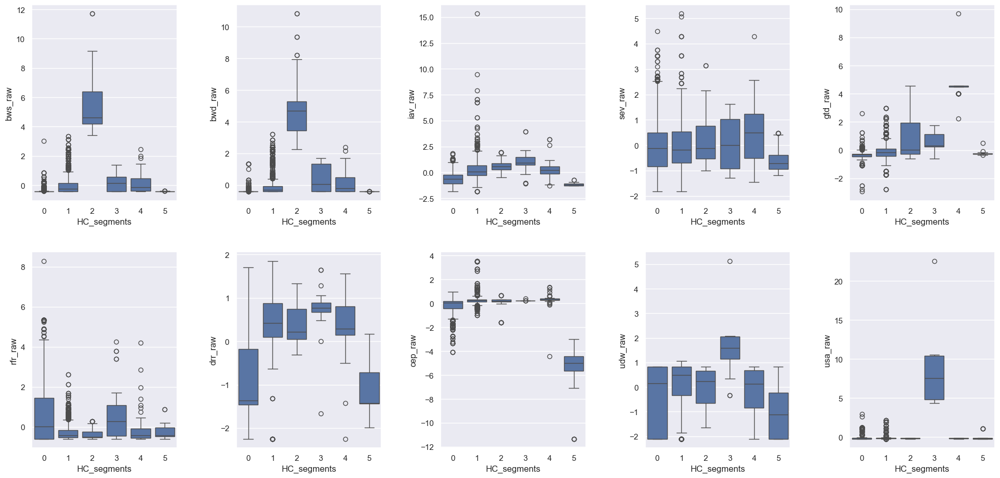

In [ ]:
# Create boxplot for each of the variables
fig, axes = plt.subplots(2, 5, figsize = (20, 10))
counter = 0

for ii in range(2):
    for jj in range(5):
        if counter < 10:
            sns.boxplot(
                ax = axes[ii][jj],
                data = df3,
                y = df3.columns[0 + counter],
                x = "HC_segments",
            )
            counter = counter + 1

fig.tight_layout(pad = 3.0)

## **GMM clustering**

In [ ]:
gmm_df = data_pca.copy()

In [ ]:
gmm = GaussianMixture(n_components = 6 , random_state = 1) # Initializing the Gaussian Mixture algorithm with n_components = 4

gmm.fit(gmm_df) # Fit the Gaussian Mixture algorithm on the gmm_df

GaussianMixture(n_components=6, random_state=1)

### **Cluster Profiling**

In [ ]:
# Creating a copy of the original data
df4 = subset_scaled_df.copy()

# Adding gmm cluster labels to the GMM and original dataframes
gmm_df["GMM_segments"] = gmm.predict(gmm_df)
df4["GMM_segments"] = gmm.predict(data_pca)

In [ ]:
# Take the cluster-wise mean of all the variables.
gmm_cluster_profile = df4.groupby("GMM_segments").mean()


In [ ]:
# Create the "count_in_each_segment" column in gmm cluster profile
gmm_cluster_profile["bws_raw"] = (
    df4.groupby("GMM_segments")["bws_raw"].count().values
)

In [ ]:
# Highlight the maximum average value among all the clusters for each of the variables
gmm_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0)

,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
GMM_segments,,,,,,,,,,
0,362,-0.414443,-0.744363,-0.027928,-0.363138,1.266236,-0.986779,-1.147293,-0.110759,0.093585
1,204,-0.209664,-0.611021,-0.128295,-0.334311,-0.592030,-1.617667,-0.005836,-2.110477,-0.233236
2,1254,-0.354061,0.044359,-0.060762,-0.183303,-0.253139,0.414772,0.201347,0.297611,-0.141281
3,101,-0.100391,-0.025228,0.274597,-0.284745,1.352228,-0.252686,-0.481881,-0.670182,0.109567
4,79,0.389978,1.794110,0.377565,0.661487,0.424694,0.420920,0.234679,0.801951,3.560672
5,691,0.891640,0.288415,0.079473,0.587582,-0.275387,0.230627,0.280972,0.147268,-0.146874


**Let's plot the boxplot**

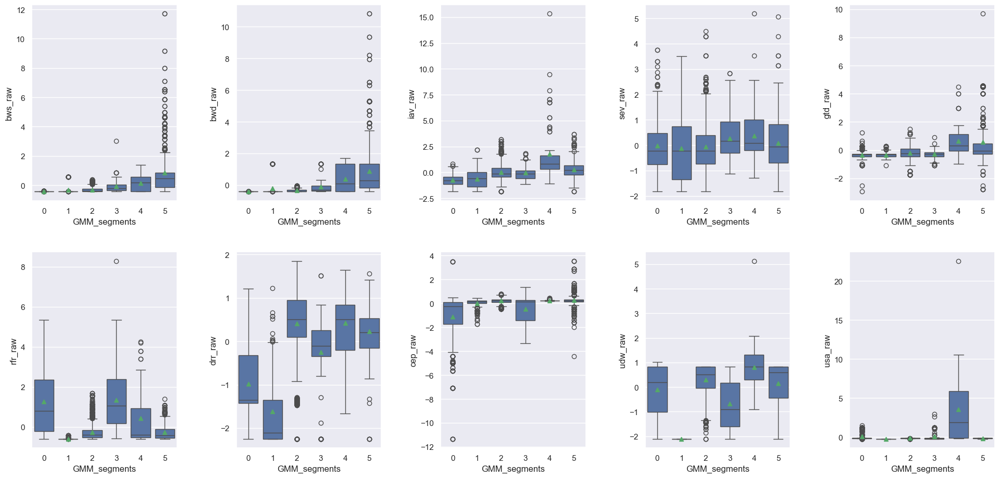

In [ ]:
# Create boxplot for each of the variables
fig, axes = plt.subplots(2, 5, figsize = (20, 10))
counter = 0

for ii in range(3):
    for jj in range(5):
        if counter < 10:
            sns.boxplot(
                ax = axes[ii][jj],
                data = df4,
                y = df4.columns[0 + counter],
                x = "GMM_segments",showmeans = True
            )
            counter = counter + 1

fig.tight_layout(pad = 3.0)

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, we have no control over it, unlike a supervised learning algorithm, which allows us to test our algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.

### **What is the silhouette score?**

Silhouette score is one of the methods for evaluating the quality of clusters created using clustering algorithms such as K-Means. The silhouette score is a measure of how similar an object is to its cluster (cohesion) compared to other clusters (separation). Silhouette score has a range of [-1, 1].

* Silhouette coefficients near +1 indicate that the sample is far away from the neighboring clusters. 
* Silhouette score near -1 indicates that those samples might have been assigned to the wrong cluster.

In [ ]:
dbscan_df = data_pca.copy()

In [ ]:
# Initializing lists
eps_value = [2,3]                       # Taking random eps value
min_sample_values = [6,20]              # Taking random min_sample value

# Creating a dictionary for each of the values in eps_value with min_sample_values
res = {eps_value[i]: min_sample_values for i in range(len(eps_value))}  

In [ ]:
# Finding the silhouette_score for each of the combination
high_silhouette_avg = 0                                               # Assigning 0 to the high_silhouette_avg variable
high_i_j = [0, 0]                                                     # Assigning 0's to the high_i_j list
key = res.keys()                                                      # Assigning dictionary keys to a variable called key
for i in key:
    z = res[i]                                                        # Assigning dictionary values of each i to z
    for j in z:
        db = DBSCAN(eps = i, min_samples = j).fit(dbscan_df)          # Applying DBScan to each of the combinations in dictionary
        core_samples_mask = np.zeros_like(db.labels_, dtype = bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        silhouette_avg = silhouette_score(dbscan_df, labels)           # Finding silhouette score 
        print( 
            "For eps value =" + str(i),
            "For min sample =" + str(j),
            "The average silhoutte_score is :",
            silhouette_avg,                                            # Printing the silhouette score for each of the combinations
        )
        if high_silhouette_avg < silhouette_avg:                       # If the silhouette score is greater than 0 or the previous score, it will get appended to the high_silhouette_avg list with its combination of i and j              
            high_i_j[0] = i
            high_i_j[1] = j

For eps value =2 For min sample =6 The average silhoutte_score is : 0.3320239628687793
For eps value =2 For min sample =20 The average silhoutte_score is : 0.4950073644743449
For eps value =3 For min sample =6 The average silhoutte_score is : 0.6124937365635602
For eps value =3 For min sample =20 The average silhoutte_score is : 0.6353846272467764


In [ ]:
# Printing the highest silhouette score
print(
    "Highest_silhoutte_avg is {} for eps = {} and min sample = {}".format(
        high_silhouette_avg, high_i_j[0], high_i_j[1]
    )
)

Highest_silhoutte_avg is 0 for eps = 3 and min sample = 20


In [ ]:
# Applying DBSCAN with the hyperparmeter values that we got
dbs = DBSCAN(eps = 3, min_samples = 20)

In [ ]:
# Creating a copy of the original data
df5 = subset_scaled_df.copy()

dbscan_df.columns = dbscan_df.columns.astype(str)

# Add DBSCAN cluster labels to dbscan data
dbscan_df["db_segments"] = dbs.fit_predict(dbscan_df)

# Add DBSCAN cluster labels to original data
df5["db_segments"] =  dbs.fit_predict(dbscan_df)

### **Cluster Profiling**

In [ ]:
# Take the cluster-wise mean of all the variables.
db_cluster_profile = df5.groupby("db_segments").mean()

In [ ]:
# Create the "count_in_each_segment" column in hierarchical cluster profile
db_cluster_profile["bws_raw"] = (
    df5.groupby("db_segments")["bws_raw"].count().values
)

In [ ]:
# Highlight the maximum average value among all the clusters for each of the variables
db_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0)


,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw
db_segments,,,,,,,,,,
-1,55,1.876574,1.558370,0.366419,1.017058,0.355857,0.401784,-0.698490,0.898998,4.735939
0,2636,-0.039155,-0.032515,-0.007645,-0.021221,-0.007425,-0.008383,0.014574,-0.018758,-0.098815


## **Choosing the Best Algorithm**

- Since cluster profiles are the same for every algorithm except DBSCAN, it is difficult to choose the best algorithm. We can compute the silhouette score to choose the best algorithm among all the algorithms.

In [ ]:
# Initializing K-Means with number of clusters as 4 and random_state = 1
kmeans = KMeans(n_clusters = 4, random_state = 1)  

# Fitting and predicting K-Means on data_pca
preds = kmeans.fit_predict((data_pca)) 

# Calculating the silhouette score
score = silhouette_score(data_pca, preds)                

print(score)         

0.29475170074926454


In [ ]:
# Initialize K-Medoids with number of clusters as 4 and random_state = 1
kmedoids = KMedoids(n_clusters = 4, random_state = 1)

# Fitting and predicting K-Medoids on data_pca
preds = kmedoids.fit_predict((data_pca))

# Calculate the silhouette score
score = silhouette_score(data_pca, preds)

# Print the score 
print(score)

0.06211638153921501


In [ ]:
# Initialize Agglomerative Clustering with distance as Euclidean, linkage as ward with clusters = 4
HCmodel = AgglomerativeClustering(n_clusters = 4, metric = "euclidean", linkage = "ward",) 

# Fitting and predicting HC algorithm on data_pca  
preds = HCmodel.fit_predict(data_pca)  

# Calculate the silhouette score
score = silhouette_score(data_pca, preds)

# Print the score 
print(score)

0.22323274334494783


In [ ]:
# Initialize Gaussian Mixture algorithm with number of clusters as 4 and random_state = 1
gmm = GaussianMixture(n_components=4, random_state=1)   

# Fitting and predicting Gaussian Mixture algorithm on data_pca
preds = gmm.fit_predict((data_pca))

# Calculate the silhouette score
score = silhouette_score(data_pca, preds)

# Print the score 
print(score)

0.21020617152902676


### **Results**

**Based on the silhouette score, we can see that K-Means algorithm is giving the best score on the data.**

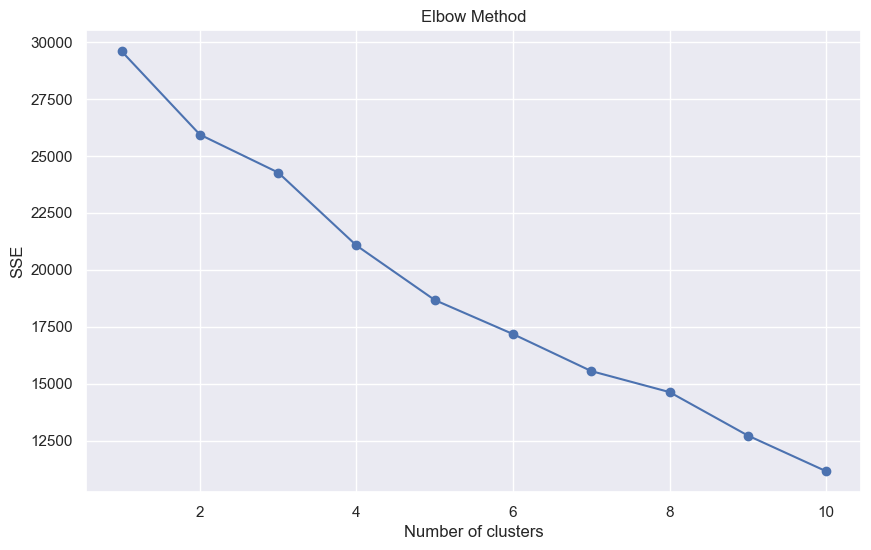

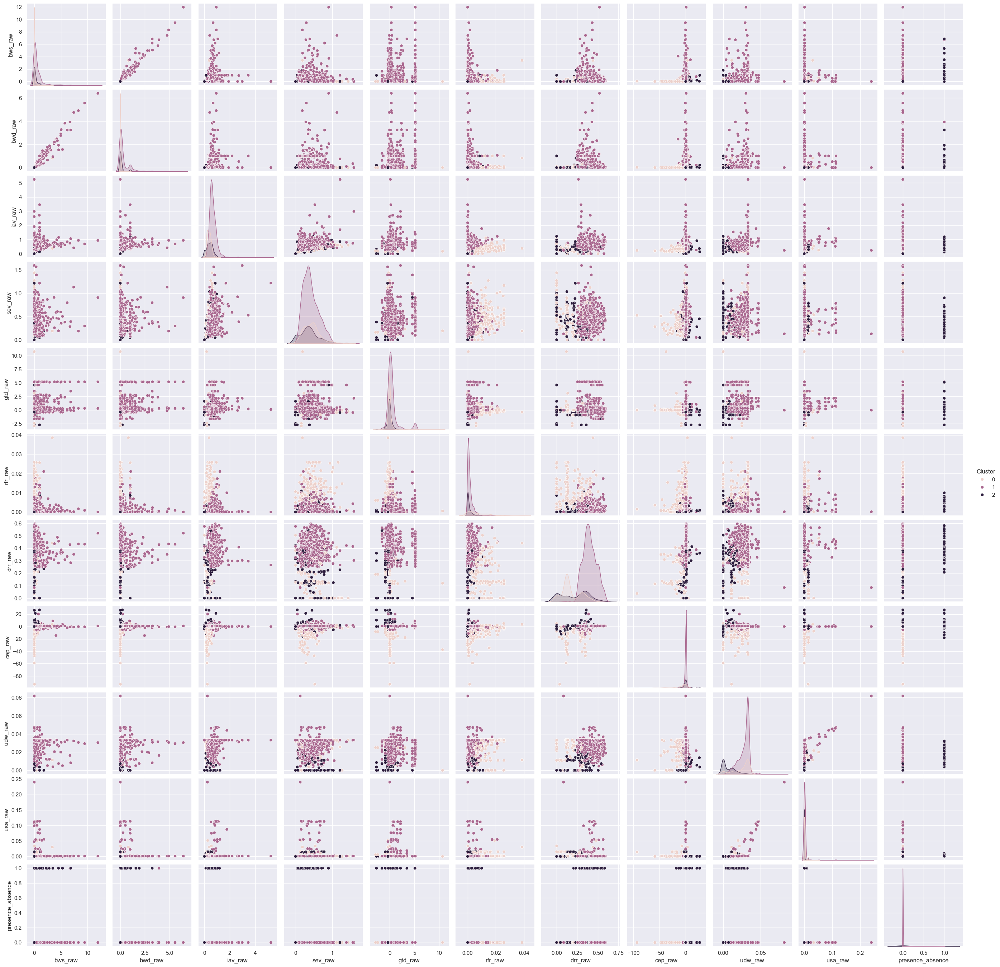

Silhouette Score: 0.20709111365590405


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "../data/merged_data.csv"
data = pd.read_csv(file_path)

# Select relevant columns (_raw variables and presence_absence)
raw_columns = [col for col in data.columns if col.endswith('_raw')] + ['presence_absence']
data_raw = data[raw_columns]

# Normalize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_raw)

# Determine the optimal number of clusters using the elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(data_scaled)
    sse.append(kmeans.inertia_)

# Plot the elbow method
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

# Choose an optimal number of clusters (e.g., k=3)
kmeans = KMeans(n_clusters=3, random_state=0)
data['Cluster'] = kmeans.fit_predict(data_scaled)

# Analyze the clusters
sns.pairplot(data, hue='Cluster', vars=raw_columns)
plt.show()

# Calculate silhouette score
sil_score = silhouette_score(data_scaled, data['Cluster'])
print(f'Silhouette Score: {sil_score}')


## Hotspot Analysis

In [ ]:
import pandas as pd
import geopandas as gpd
from esda.getisord import G_Local
from libpysal.weights import Queen
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv('../data/merged_data.csv')

# Filter for relevant variables
relevant_columns = [col for col in df.columns if col.endswith('_raw')] + ['presence_absence', 'state']
data = df[relevant_columns]

# Aggregate data by state
state_data = data.groupby('state').mean().reset_index()
state_data



,state,bws_raw,bwd_raw,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,presence_absence
0,Alabama,0.172974,0.059066,0.792913,0.534662,0.380397,0.000514,0.359752,-2.322337,0.028411,0.001008,0.017544
1,Alaska,0.036603,0.029806,0.385356,0.455972,-0.050988,0.004955,0.086997,-6.615162,0.018155,0.001669,0.000000
2,Arizona,1.001156,0.591162,0.872572,0.361863,0.892011,0.001323,0.296575,-0.079592,0.028805,0.008392,0.045045
3,Arkansas,0.193533,0.094617,0.832771,0.417517,0.446236,0.001483,0.416208,0.934831,0.031391,0.001111,0.000000
4,California,1.057344,0.554030,0.695580,0.510558,0.950434,0.002587,0.357973,0.790737,0.020014,0.002262,0.045455
5,Colorado,0.748389,0.411800,0.436689,0.561255,0.778600,0.003145,0.408480,0.332421,0.028968,0.001027,0.060606
6,Delaware,0.355634,0.083577,0.364815,0.328588,0.602974,0.000319,0.371630,7.417195,0.013401,0.000491,1.000000
7,Florida,0.290929,0.099534,0.563289,0.343007,0.285415,0.003650,0.289044,-5.774403,0.017494,0.001178,0.066667
8,Georgia,0.246561,0.063623,0.491745,0.271727,0.668749,0.001080,0.382746,-1.912463,0.028036,0.000995,0.083333
9,Idaho,0.581581,0.338008,0.551552,0.501485,0.098695,0.002431,0.343741,-0.797442,0.030856,0.001287,0.023810


('WARNING: ', 0, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 18, ' is an island (no neighbors)')
('WARNING: ', 33, ' is an island (no neighbors)')


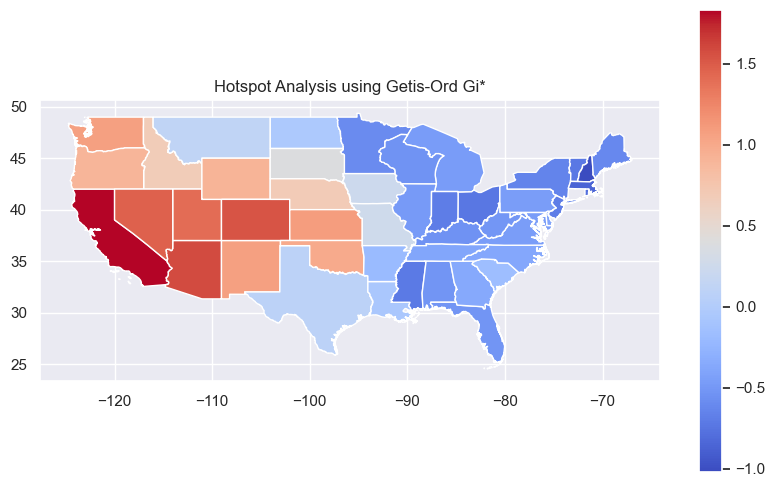

In [ ]:
# Load the shapefile with state boundaries
gdf_states = gpd.read_file('../shapefile/ne_10m_admin_1_states_provinces/ne_10m_admin_1_states_provinces.shp')

# Merge state data with the GeoDataFrame
gdf_states = gdf_states.merge(state_data, left_on='name', right_on='state')

# Calculate spatial weights
w = Queen.from_dataframe(gdf_states)

# Perform Getis-Ord Gi* analysis for one of the _raw variables, e.g., 'bws_raw'
g_local = G_Local(gdf_states['bws_raw'], w)

# Add Z-scores to the GeoDataFrame
gdf_states['z_score'] = g_local.Zs

# Plot the Z-scores
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
gdf_states.plot(column='z_score', cmap='coolwarm', legend=True, ax=ax)
plt.title('Hotspot Analysis using Getis-Ord Gi*')
plt.show()

#### Spatial Analysis- Hotspot Analysis

In [1]:
import esda
import json
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
import libpysal as lps
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

In [2]:
states_dict = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}



position_dict = {
        'AL': 'top center',
        'AR': 'middle center',
        'AZ': 'middle center',
        'CA': 'bottom center',
        'CO': 'middle left',
        'CT': 'middle center',
        'DC': 'middle center',
        'DE': 'middle center',
        'FL': 'middle right',
        'GA': 'middle center',
        'IA': 'middle center',
        'ID': 'bottom center',
        'IL': 'middle center',
        'IN': 'middle center',
        'KS': 'middle center',
        'KY': 'middle right',
        'LA': 'bottom center',
        'MA': 'middle center',
        'MD': 'middle center',
        'ME': 'top center',
        'MI': 'bottom right',
        'MN': 'middle center',
        'MO': 'middle center',
        'MS': 'top center',
        'MT': 'middle center',
        'NC': 'middle center',
        'ND': 'middle center',
        'NE': 'middle center',
        'NH': 'middle center',
        'NJ': 'middle center',
        'NM': 'top left',
        'NV': 'top center',
        'NY': 'middle center',
        'OH': 'middle center',
        'OK': 'middle center',
        'OR': 'bottom center',
        'PA': 'middle center',
        'RI': 'middle center',
        'SC': 'middle center',
        'SD': 'middle left',
        'TN': 'middle center',
        'TX': 'top center',
        'UT': 'middle center',
        'VA': 'middle right',
        'VT': 'middle center',
        'WA': 'bottom center',
        'WI': 'bottom center',
        'WV': 'middle center',
        'WY': 'middle center'
}

lon_dict = {
        'AL': 0,
        'AR': 0,
        'AZ': 0,
        'CA': 0,
        'CO': 0,
        'CT': 6,
        'DC': 4,
        'DE': 3,
        'FL': 0,
        'GA': 0,
        'IA': 0,
        'ID': 0,
        'IL': 0,
        'IN': 0,
        'KS': 0,
        'KY': 0,
        'LA': 0,
        'MA': 6,
        'MD': 5,
        'ME': 0,
        'MI': 0,
        'MN': 0,
        'MO': 0,
        'MS': 0,
        'MT': 0,
        'NC': 0,
        'ND': 0,
        'NE': 0,
        'NH': 6,
        'NJ': 3.5,
        'NM': 0,
        'NV': 0,
        'NY': 0,
        'OH': 0,
        'OK': 0,
        'OR': 0,
        'PA': 0,
        'RI': 5,
        'SC': 0,
        'SD': 0,
        'TN': 0,
        'TX': 0,
        'UT': 0,
        'VA': 0,
        'VT': -2,
        'WA': 0,
        'WI': 0,
        'WV': 0,
        'WY': 0,
}

lat_dict = {
        'AL': 0,
        'AR': 0,
        'AZ': 0,
        'CA': 0,
        'CO': 0,
        'CT': -2.25,
        'DC': -3,
        'DE': -1.5,
        'FL': 0,
        'GA': 0,
        'IA': 0,
        'ID': 0,
        'IL': 0,
        'IN': 0,
        'KS': 0,
        'KY': 0,
        'LA': 0,
        'MA': 0,
        'MD': 0,
        'ME': 0,
        'MI': 0,
        'MN': 0,
        'MO': 0,
        'MS': 0,
        'MT': 0,
        'NC': 0,
        'ND': 0,
        'NE': 0,
        'NH': 0,
        'NJ': 0,
        'NM': 0,
        'NV': 0,
        'NY': 0,
        'OH': 0,
        'OK': 0,
        'OR': 0,
        'PA': 0,
        'RI': -1,
        'SC': 0,
        'SD': 0,
        'TN': 0,
        'TX': 0,
        'UT': 0,
        'VA': 0,
        'VT': 3,
        'WA': 0,
        'WI': 0,
        'WV': 0,
        'WY': 0,
}

In [3]:
# def hot_spot_analysis(gdf, target, geojson, p_value=0.05, annotation=False,
#                       palette="rdbu_r", v_scale=3):
#     gdf = gdf.copy()
#     wq = lps.weights.Queen.from_dataframe(gdf)
#     wq.transform = 'r'
#     y = gdf[target]
#     lg = esda.getisord.G_Local(y, wq, seed=42, star=1)

#     labels = lg.Zs * (lg.p_sim < p_value)
#     gdf = gdf.assign(cl=labels)
# #     vmax = np.abs(labels).max()
# #     print(vmax)
#     vmax = v_scale

# #     fig = px.choropleth(
# #         gdf,
# #         geojson=geojson,
# #         locations='NAME',
# #         # locationmode="USA-states", 
# #         color='cl', color_continuous_scale="rdbu_r", scope="usa",
# #                         range_color=(-vmax, vmax),
# #                         featureidkey="properties.NAME",
# #                         labels={'cl': f'{target} Z-Score'}
# #                        )
#     fig = px.choropleth(
#         gdf,
#         title=target,
#         locations='NAME', 
#         geojson=geojson,
#         featureidkey="properties.NAME",
#         scope="usa",                    
#         color='cl',
#         color_continuous_scale=palette,
#         range_color=(-vmax, vmax),
#         labels={'cl': 'Z-Score'},
#     )
#     colors = np.where(gdf['cl'].values > 1.2, "white", "black")
#     line_fmt = np.array(["LA", "TN", "VT", "NH", "MA", "RI", "CT", "NJ",
#                          "MD", "DE", "DC"])
#     fmts = np.where(np.in1d(gdf["state"].values, line_fmt),
#                     "%{id} %{text:.2f}", "%{id} <br> %{text:.2f}")
#     fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0},
#                       title_text=target.replace("_", " "),
#                       title_x=0.5)
# #     fig.update_layout(title_text=target.replace("_", " "))
#     if annotation is True:
# #         fig.add_scattergeo(
# #             locations = gdf['NAME'],
# #             ids=gdf["STATE_CODE"],
# #             geojson=states,
# #             featureidkey="properties.NAME",
# #             text = gdf['cl'],
# #             mode = 'text',
# #             texttemplate = fmts,
# #             textfont = {"color": colors, "size": 10},
# #             textposition=gdf["position"].values,
# #         )
#         lat = gdf.geometry.centroid.y
#         lon = gdf.geometry.centroid.x
#         fig.add_scattergeo(
#             lat=lat + gdf["lat"],
#             lon=lon + gdf["lon"],
#             ids=gdf["state"],
#             text=gdf['cl'],
#             mode="text",
#             texttemplate = fmts,
#             textfont = {"color": colors, "size": 10},
#             textposition=gdf["position"].values,
#             showlegend=False
#         )

#         for x, dx, y, dy in zip(lon, gdf["lon"], lat, gdf["lat"]):
#             fig.add_scattergeo(
#                 lon = [x, x + dx - 1.2*np.sign(dx)],
#                 lat = [y, y + dy - 0.75*np.sign(dy)],
#                 mode = 'lines',
#                 line = dict(width = 1,color = 'black'),
#                 showlegend=False
#             )
#     fig.show()
#     print(type(fig))
#     return (
#         gdf.copy()
#         .assign(
#             Z_score = lg.Zs,
#             p_value = lg.p_sim,
#             labels = labels,
#         )
#     )


def hot_spot_analysis(gdf, target, geojson, p_value=0.05, annotation=False,
                      palette="rdbu_r", v_scale=3):
    # Create a copy of the GeoDataFrame to avoid modifying the original data
    gdf = gdf.copy()

    # Calculate Queen contiguity weights from the DataFrame
    wq = lps.weights.Queen.from_dataframe(gdf)
    wq.transform = 'r'  # Row-standardize the weights

    # Extract the target variable column to analyze
    y = gdf[target]

    # Compute Getis-Ord Gi* local statistic for the target variable
    lg = esda.getisord.G_Local(y, wq, seed=42, star=True)

    # Calculate Z-scores and apply p-value threshold to determine significance
    labels = lg.Zs * (lg.p_sim < p_value)
    gdf = gdf.assign(cl=labels)

    # Set the maximum color scale value for the visualization
    #vmax = v_scale
    vmax = max(abs(gdf['cl'].min()), gdf['cl'].max())

    # Create a choropleth map using Plotly Express
    fig = px.choropleth(
        gdf,
        title=target,  # Set the title of the map
        locations='NAME',  # DataFrame column with locations names
        geojson=geojson,  # GeoJSON geometries
        featureidkey="properties.NAME",  # Path to the feature IDs in the GeoJSON
        scope="usa",  # Focus the map on the USA
        color='cl',  # DataFrame column that determines the color of the map
        color_continuous_scale=palette,  # Color palette
        range_color=(-vmax, vmax),  # Range for color scale
        labels={'cl': 'Z-Score'},  # Label for the color scale
    )

    # Determine text colors based on Z-score values (higher than 1.2 uses white, otherwise black)
    colors = np.where(gdf['cl'].values > 1.2, "white", "black")

    # Define special formatting for states with specific codes
    line_fmt = np.array(["LA", "TN", "VT", "NH", "MA", "RI", "CT", "NJ", "MD", "DE", "DC"])
    fmts = np.where(np.in1d(gdf["state"].values, line_fmt),
                    "%{id} %{text:.2f}", "%{id} <br> %{text:.2f}")

    # Optional: add annotations to the map if enabled
    if annotation:
        lat = gdf.geometry.centroid.y
        lon = gdf.geometry.centroid.x
        fig.add_scattergeo(
            lat=lat + gdf["lat"],  # Adjust latitude for annotations
            lon=lon + gdf["lon"],  # Adjust longitude for annotations
            ids=gdf["state"],
            text=gdf['cl'],
            mode="text",
            texttemplate=fmts,
            textfont={"color": colors, "size": 10},
            textposition=gdf["position"].values,
            showlegend=False
        )
        # Add lines from points to text if annotations are far from the points
        for x, dx, y, dy in zip(lon, gdf["lon"], lat, gdf["lat"]):
            fig.add_scattergeo(
                lon=[x, x + dx - 1.2*np.sign(dx)],
                lat=[y, y + dy - 0.75*np.sign(dy)],
                mode='lines',
                line=dict(width=1, color='black'),
                showlegend=False
            )

    # Display the figure
    fig.show()
    print(type(fig))

    # Return the GeoDataFrame with additional columns for Z-scores, p-values, and labels
    return (
        gdf.copy()
        .assign(
            Z_score=lg.Zs,
            p_value=lg.p_sim,
            labels=labels,
        )
    )


In [4]:
state_abbreviations = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
    'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA',
    'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN',
    'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA',
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}


In [5]:
import pandas as pd

# Define the path to your CSV file
file_path = "../data/merged_data.csv"

# Load the CSV file
df = pd.read_csv(file_path)


In [6]:

# Convert state names to abbreviations in your DataFrame
df['NAME'] = df['state']
df['state'] = df['state'].map(state_abbreviations)
df

,string_id,aq30_id,pfaf_id,gid_1,aqid,gid_0,country,state,area_km2,bws_raw,...,iav_raw,sev_raw,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,presence_absence,NAME
0,725572-USA.23_1-844,53190,725572,USA.23_1,844,USA,United States,MI,2062.767827,0.577778,...,0.322604,0.319555,-0.430512,0.001230,0.404088,1.850749,0.020419,0.000733,1,Michigan
1,732402-USA.41_1-1400,53878,732402,USA.41_1,1400,USA,United States,SC,1981.427932,0.671913,...,0.474361,0.170584,0.602974,0.000790,0.367905,-0.261415,0.024722,0.000881,1,South Carolina
2,774160-USA.5_1-1441,58402,774160,USA.5_1,1441,USA,United States,CA,6489.297197,5.307029,...,0.723832,0.501935,-0.365303,0.000961,0.366932,3.497037,0.005112,0.000205,1,California
3,781002-USA.38_1-725,58589,781002,USA.38_1,725,USA,United States,OR,9329.110744,0.063482,...,0.387921,0.501520,-0.027497,0.001441,0.294180,-18.101568,0.019064,0.000686,1,Oregon
4,732571-USA.10_1-1400,53938,732571,USA.10_1,1400,USA,United States,FL,9542.228009,0.694238,...,0.581573,0.441926,0.602974,0.007218,0.315998,-9.788635,0.005696,0.000225,1,Florida
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2686,742850-USA.16_1-1342,54698,742850,USA.16_1,1342,USA,United States,IA,3020.236135,0.034949,...,0.602831,0.491119,0.392393,0.000290,0.575922,0.934831,0.025940,0.000923,0,Iowa
2687,742850-USA.16_1-1357,54699,742850,USA.16_1,1357,USA,United States,IA,0.039441,0.034949,...,0.602831,0.491119,0.299090,0.000290,0.575922,0.934831,0.025940,0.000923,0,Iowa
2688,742861-USA.16_1-1216,54700,742861,USA.16_1,1216,USA,United States,IA,984.954139,0.001900,...,0.603460,0.504561,-0.274031,0.000712,0.569525,0.934831,0.033246,0.001175,0,Iowa
2689,742862-USA.16_1-1216,54701,742862,USA.16_1,1216,USA,United States,IA,11438.178907,0.350007,...,0.977279,0.524131,-0.274031,0.000424,0.579359,0.934831,0.025209,0.000898,0,Iowa


In [7]:
# Apply the mappings for position, longitude, and latitude
df['position'] = df['state'].map(position_dict)
df['lon'] = df['state'].map(lon_dict)
df['lat'] = df['state'].map(lat_dict)
df

,string_id,aq30_id,pfaf_id,gid_1,aqid,gid_0,country,state,area_km2,bws_raw,...,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,presence_absence,NAME,position,lon,lat
0,725572-USA.23_1-844,53190,725572,USA.23_1,844,USA,United States,MI,2062.767827,0.577778,...,0.001230,0.404088,1.850749,0.020419,0.000733,1,Michigan,bottom right,0.0,0.0
1,732402-USA.41_1-1400,53878,732402,USA.41_1,1400,USA,United States,SC,1981.427932,0.671913,...,0.000790,0.367905,-0.261415,0.024722,0.000881,1,South Carolina,middle center,0.0,0.0
2,774160-USA.5_1-1441,58402,774160,USA.5_1,1441,USA,United States,CA,6489.297197,5.307029,...,0.000961,0.366932,3.497037,0.005112,0.000205,1,California,bottom center,0.0,0.0
3,781002-USA.38_1-725,58589,781002,USA.38_1,725,USA,United States,OR,9329.110744,0.063482,...,0.001441,0.294180,-18.101568,0.019064,0.000686,1,Oregon,bottom center,0.0,0.0
4,732571-USA.10_1-1400,53938,732571,USA.10_1,1400,USA,United States,FL,9542.228009,0.694238,...,0.007218,0.315998,-9.788635,0.005696,0.000225,1,Florida,middle right,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2686,742850-USA.16_1-1342,54698,742850,USA.16_1,1342,USA,United States,IA,3020.236135,0.034949,...,0.000290,0.575922,0.934831,0.025940,0.000923,0,Iowa,middle center,0.0,0.0
2687,742850-USA.16_1-1357,54699,742850,USA.16_1,1357,USA,United States,IA,0.039441,0.034949,...,0.000290,0.575922,0.934831,0.025940,0.000923,0,Iowa,middle center,0.0,0.0
2688,742861-USA.16_1-1216,54700,742861,USA.16_1,1216,USA,United States,IA,984.954139,0.001900,...,0.000712,0.569525,0.934831,0.033246,0.001175,0,Iowa,middle center,0.0,0.0
2689,742862-USA.16_1-1216,54701,742862,USA.16_1,1216,USA,United States,IA,11438.178907,0.350007,...,0.000424,0.579359,0.934831,0.025209,0.000898,0,Iowa,middle center,0.0,0.0


In [8]:
with open('../shapefile/gz_2010_us_040_00_20m.json') as fin:
    geojson = json.load(fin)
    
gdf = gpd.read_file('../shapefile/gz_2010_us_040_00_20m.json')
gdf = pd.merge(gdf, df, on='NAME')
# gdf.head(5)

In [9]:
gdf = gdf.round(1)
gdf

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry,string_id,aq30_id,pfaf_id,gid_1,...,gtd_raw,rfr_raw,drr_raw,cep_raw,udw_raw,usa_raw,presence_absence,position,lon,lat
0,0400000US04,04,Arizona,,113594.1,"POLYGON ((-112.53859 37.00067, -112.53454 37.0...",772240-USA.3_1-1637,57916,772240,USA.3_1,...,3.5,0.0,0.3,0.1,0.0,0.0,1,middle center,0.0,0.0
1,0400000US04,04,Arizona,,113594.1,"POLYGON ((-112.53859 37.00067, -112.53454 37.0...",772240-USA.3_1-1628,57915,772240,USA.3_1,...,1.5,0.0,0.3,0.1,0.0,0.0,1,middle center,0.0,0.0
2,0400000US04,04,Arizona,,113594.1,"POLYGON ((-112.53859 37.00067, -112.53454 37.0...",772218-USA.3_1-1600,57888,772218,USA.3_1,...,2.2,0.0,0.3,-0.1,0.0,0.0,1,middle center,0.0,0.0
3,0400000US04,04,Arizona,,113594.1,"POLYGON ((-112.53859 37.00067, -112.53454 37.0...",772221-USA.3_1-1628,57895,772221,USA.3_1,...,1.5,0.0,0.3,-0.1,0.0,0.0,1,middle center,0.0,0.0
4,0400000US04,04,Arizona,,113594.1,"POLYGON ((-112.53859 37.00067, -112.53454 37.0...",772250-USA.3_1-1628,57919,772250,USA.3_1,...,1.5,0.0,0.3,-0.1,0.0,0.0,1,middle center,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2686,0400000US48,48,Texas,,261231.7,"MULTIPOLYGON (((-96.83003 28.11184, -96.82705 ...",751620-USA.44_1-1400,55184,751620,USA.44_1,...,0.6,0.0,0.4,1.0,0.0,0.0,0,top center,0.0,0.0
2687,0400000US48,48,Texas,,261231.7,"MULTIPOLYGON (((-96.83003 28.11184, -96.82705 ...",751620-USA.44_1-1692,55185,751620,USA.44_1,...,0.2,0.0,0.4,1.0,0.0,0.0,0,top center,0.0,0.0
2688,0400000US48,48,Texas,,261231.7,"MULTIPOLYGON (((-96.83003 28.11184, -96.82705 ...",751630-USA.44_1-1400,55186,751630,USA.44_1,...,0.6,0.0,0.4,-0.7,0.0,0.0,0,top center,0.0,0.0
2689,0400000US48,48,Texas,,261231.7,"MULTIPOLYGON (((-96.83003 28.11184, -96.82705 ...",751630-USA.44_1-1692,55187,751630,USA.44_1,...,0.2,0.0,0.4,-0.7,0.0,0.0,0,top center,0.0,0.0


In [10]:
# Example of correct mapping application
gdf['position'] = gdf['state'].map(position_dict)
gdf['lon'] = gdf['state'].map(lon_dict)
gdf['lat'] = gdf['state'].map(lat_dict)

# Handling NaNs after mapping if any
gdf['position'] = gdf['position'].fillna('middle center')
gdf['lon'] = gdf['lon'].fillna(0)  # Assuming 0 is a placeholder value
gdf['lat'] = gdf['lat'].fillna(0)  # Assuming 0 is a placeholder value

# Find rows where any of the newly mapped columns are NaN
nan_rows = gdf[gdf[['position', 'lon', 'lat']].isna().any(axis=1)]
print(nan_rows)

Empty GeoDataFrame
Columns: [GEO_ID, STATE, NAME, LSAD, CENSUSAREA, geometry, string_id, aq30_id, pfaf_id, gid_1, aqid, gid_0, country, state, area_km2, bws_raw, bwd_raw, iav_raw, sev_raw, gtd_raw, rfr_raw, drr_raw, cep_raw, udw_raw, usa_raw, presence_absence, position, lon, lat]
Index: []

[0 rows x 29 columns]


In [11]:
all_water_risk = hot_spot_analysis(gdf, "bws_raw", geojson,
                                       p_value=1., annotation=True)

C:\Users\laure\AppData\Local\Temp\ipykernel_36840\3838629768.py:98: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  wq = lps.weights.Queen.from_dataframe(gdf)
c:\Users\laure\AppData\Local\Programs\Python\Python310\lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(self, neighbors, ids=ids, **kw)
c:\Users\laure\AppData\Local\Programs\Python\Python310\lib\site-packages\esda\getisord.py:615: UserWarning: Gi* requested, but (a) weights are already row-standardized, (b) no weights are on the diagonal, and (c) no default value supplied to star. Assuming that the self-weight is equivalent to the maximum weight in the row. To use a different default (like, .5), set `star=.5`, or use libpysal.weights.fill_diagonal() to set the diagonal values of your weights matrix and use `star

<class 'plotly.graph_objs._figure.Figure'>


In [ ]:
# Check unique position values
print(gdf['lon'].unique())


[ 0.   3.   5.   3.5 -2.   6. ]
